In [1]:
import sys
import datacube
dc = datacube.Datacube(app = 'my_app', config = '/home/localuser/.datacube.conf')
from skimage.morphology import square,dilation
sys.path.append(r'/home/localuser/Datacube/data_cube_notebooks/cloudless')
from datetime import datetime
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scripts.data import *
from scripts.combiner import *
from scripts.view import *
import time
import cv2
from sklearn import preprocessing
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPRegressor #Multilayer perceptron 
from sklearn import linear_model,metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import explained_variance_score, max_error,mean_absolute_error,mean_squared_error
from sklearn.metrics import mean_squared_log_error, median_absolute_error, r2_score
from sklearn.svm import LinearSVR

In [2]:
def NDVI(composite):
    return (composite[3,:,:] - composite[0,:,:])/(composite[3,:,:] + composite[0,:,:])[np.newaxis,:,:]
def intensity(composite):
    return ((0.42*composite[2,:,:]+0.98*composite[1,:,:]+0.6*composite[0,:,:]+composite[3,:,:])/3)[np.newaxis,:,:]

In [3]:
clear_comp = np.load('test.npy')
Y_TRUE =  np.load('Y_true.npy')

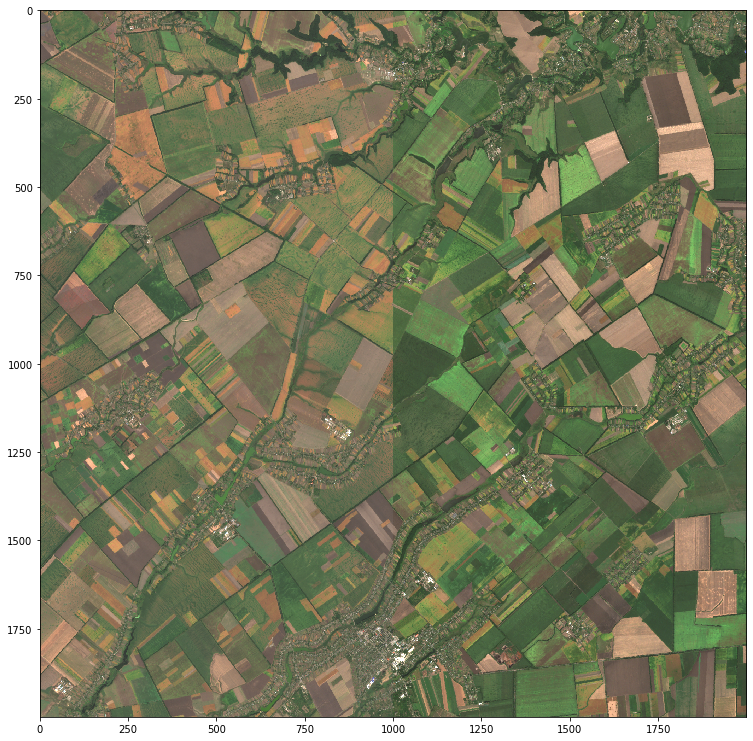

In [20]:
plot_composite(5*clear_comp)

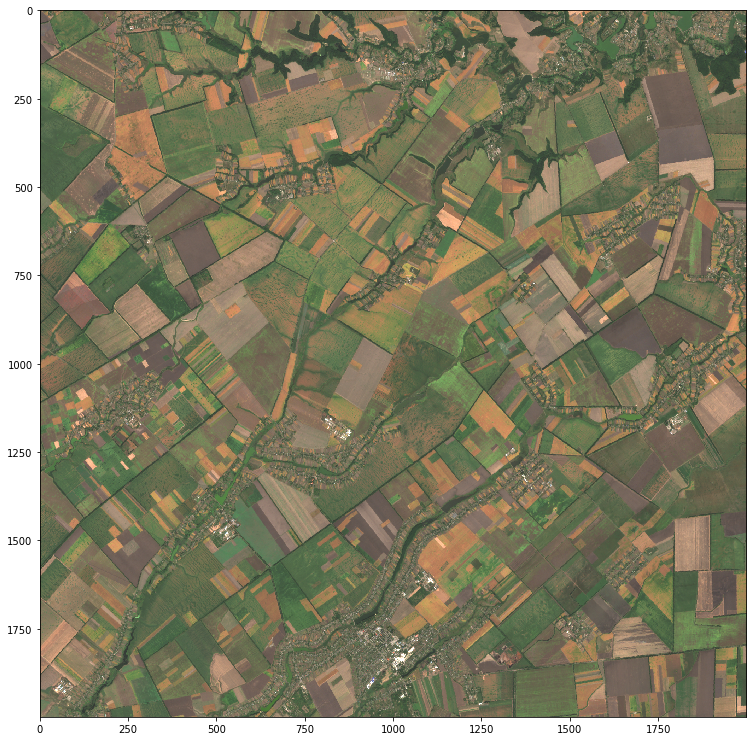

In [4]:
f = np.copy(clear_comp)
f[:,:,1000:] =Y_TRUE#
plot_composite(5*f)

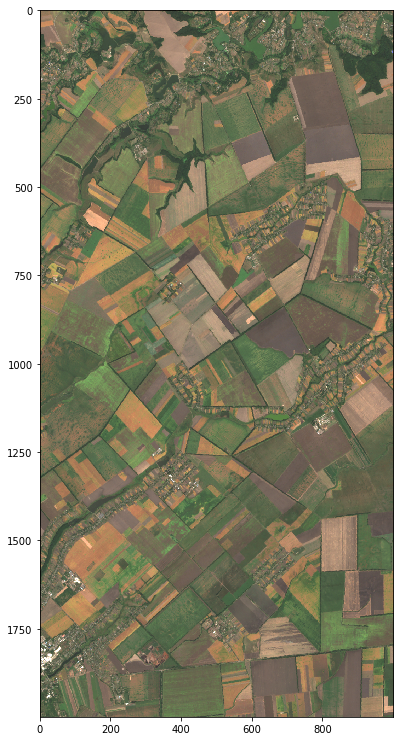

In [5]:
plot_composite(5*Y_TRUE)

# Вибираємо зону стику, де пертинаються навчальні дані.

In [6]:
region_op = clear_comp[:,:,800:1100] # опорний
region_neop = clear_comp[:,:,900:1200] #неопорний

In [8]:
region_neop.shape, region_op.shape

((4, 2000, 300), (4, 2000, 300))

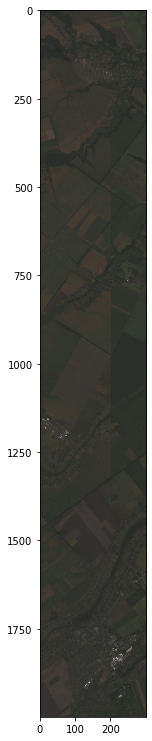

In [9]:
plot_composite(region_op)

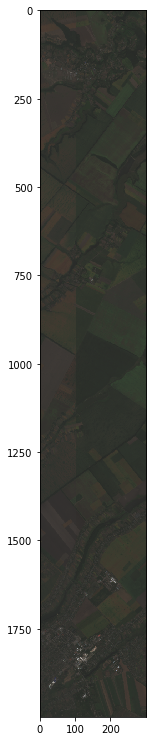

In [10]:
plot_composite(region_neop)

In [7]:
from sklearn.model_selection import train_test_split
def preparing_data(region_op, region_neop):
    #creating data
    X  = np.copy(region_neop)
    Y = np.copy(region_op)
    X_test = clear_comp[:,:,1000:]
    y_test = clear_comp[:,:,:1000]
    
    #adding two bands
    X = np.vstack([X,NDVI(X),intensity(X)])
    Y = np.vstack([Y,NDVI(Y),intensity(Y)])
    X_test = np.vstack([X_test,intensity(X_test), NDVI(X_test)])
    y_test = np.vstack([y_test,intensity(y_test), NDVI(y_test)])
    
    #reshaping
    X = np.moveaxis(X,0,-1)
    Y = np.moveaxis(Y,0,-1)
    X_test = np.moveaxis(X_test,0,-1).reshape(-1,6)
    y_test = np.moveaxis(y_test,0,-1).reshape(-1,6)
    
    #spliting
    X_train, x_None, y_train, y_None = train_test_split(X ,Y, test_size=1, random_state=42)
    X_train = X_train.reshape(-1,6)
    y_train = y_train.reshape(-1,6)
    x_None = None
    y_None = None
    
    #scaling
    for i in range(6):
        X_train[:,i] = StandardScaler().fit_transform(X_train[:,i].reshape(-1,1)).ravel()
        X_test[:,i] = StandardScaler().fit_transform(X_test[:,i].reshape(-1,1)).ravel()
        
    # X_train now is scaled
    # X_test now is scaled
    return (X_train, X_test, y_train, y_test)

In [26]:
import time

def try_mlpr(prepeared_data):
    X_train_scaled = prepeared_data[0]
    X_test_scaled = prepeared_data[1]
    y_train = prepeared_data[2]
    y_test = prepeared_data[3]
    
    result = np.empty_like(X_test_scaled)
    print(X_train_scaled.shape)
    bands = X_train_scaled.shape[1]
    
    
    for i in range(3):
        print('band',i)
        a = time.time()
        
        scaler_y =  StandardScaler().fit(y_train[:,i].reshape(-1,1))
        scaler_y_test = StandardScaler().fit(y_test[:,i].reshape(-1,1))
    
        Y_train_scaled = scaler_y.transform(y_train[:,i].reshape(-1,1))
        Y_test_scaled= scaler_y_test.transform(y_test[:,i].reshape(-1,1))
        
        
        
        mlpr = MLPRegressor(random_state=1,
                            max_iter=200,
                            hidden_layer_sizes=(300,),
                            activation = 'tanh') #solver ='adam', learning_rate = 'adaptive')
        #print('Train the model using the training sets')
        
        mlpr.fit(X_train_scaled, Y_train_scaled.ravel())
        print("Time trainning:",(time.time()-a)/60,'min')
        train_time = time.time()
        
        #print('Make predictions using the testing set')
        Y_pred_scaled = mlpr.predict(X_test_scaled)
        print('R2 score before :', r2_score(Y_pred_scaled, Y_test_scaled))
              
        print("Time predicting:",(time.time()-train_time)/60,'min')
    
        #print('svr score: %.4f' % svr.score(X_test, Y_test))
        
        
        #X_test = scaler_x_test.inverse_transform(X_test_scaled)
        Y_pred = scaler_y_test.inverse_transform(Y_pred_scaled)
        Y_test = scaler_y_test.inverse_transform(Y_test_scaled)
        
        
        print('r2_score', r2_score(Y_test, Y_pred))
        
        result[:,i] = Y_pred.ravel()
    
    result= result.reshape((2000,1000,bands))
    return result

In [ ]:
prepeared_data = preparing_data(region_op, region_neop)
res = try_mlpr(prepeared_data)
res = np.moveaxis(res, 2,0)

(599700, 6)
band 0


/home/localuser/Datacube/datacube_env/lib/python3.6/site-packages/sklearn/neural_network/multilayer_perceptron.py:568: UserWarning: Training interrupted by user.
  warnings.warn("Training interrupted by user.")


Time trainning: 17.26417554616928 min


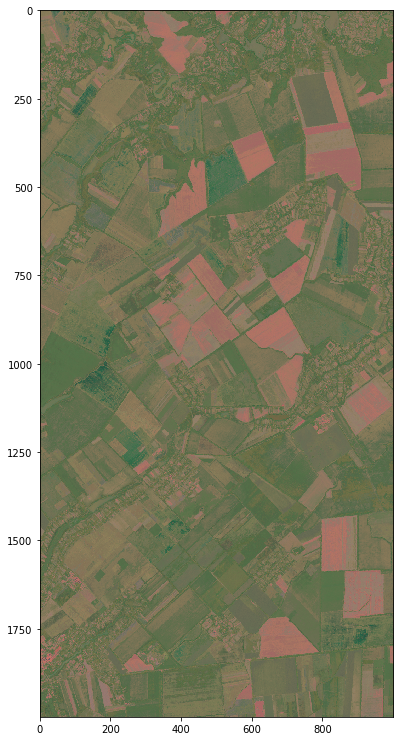

In [10]:
plot_composite(5*res.astype('float'))

In [9]:
#np.save('best.npy', res)
res = np.load('best.npy')

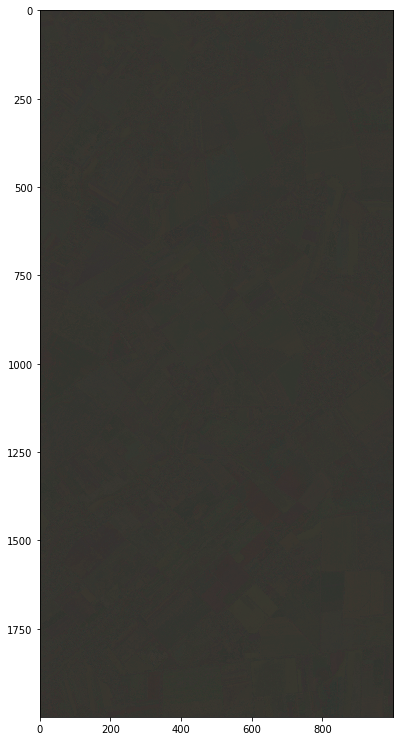

In [10]:
#random_state=1,max_iter=500,hidden_layer_sizes=(100,100,100),activation = 'tanh'
plot_composite(res.astype('float'))

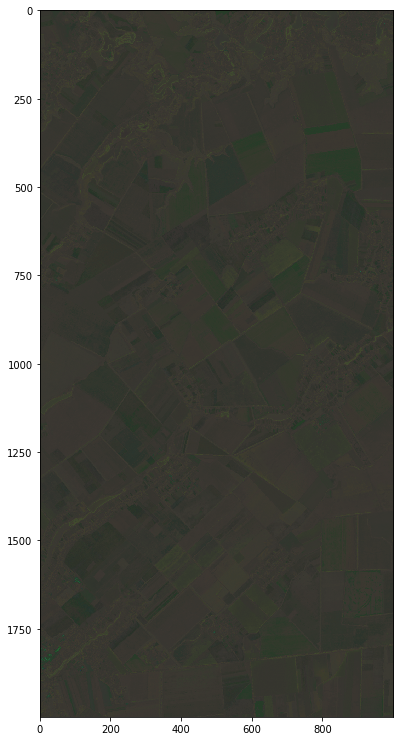

In [8]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,),activation = 'relu'
plot_composite(res.astype('float'))

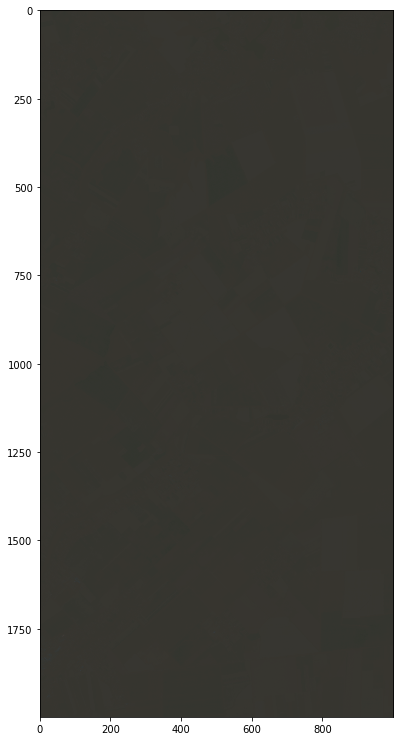

In [26]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,),activation = 'identity'
plot_composite(res.astype('float'))

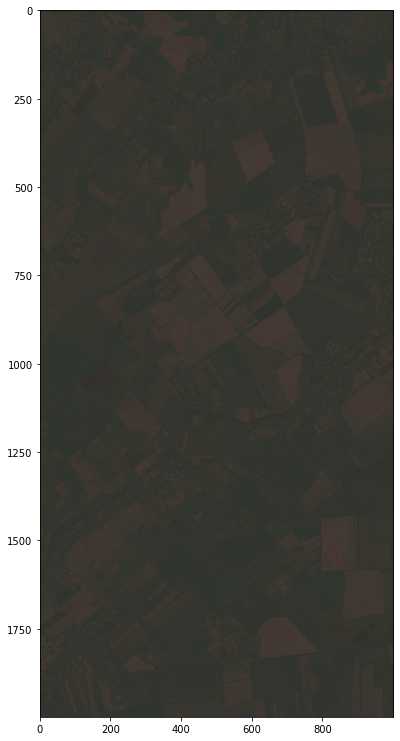

In [8]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,), activation = 'logistic'
plot_composite(res.astype('float'))

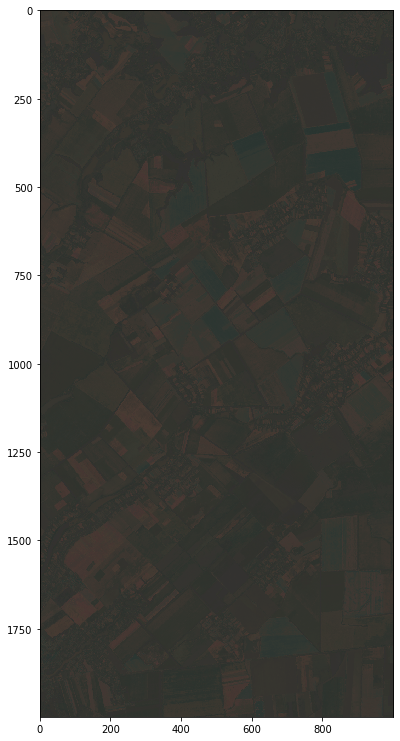

In [88]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,),activation = 'tanh'
plot_composite(res.astype('float'))

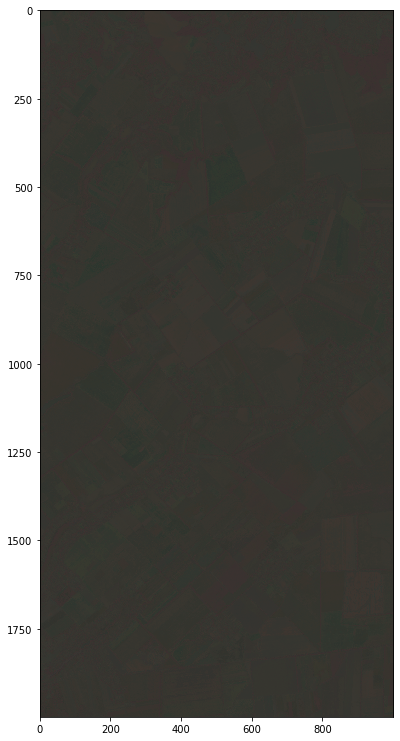

In [82]:
#(random_state=1,max_iter=300,hidden_layer_sizes=(100,100), activation = 'logistic'
plot_composite(res.astype('float'))

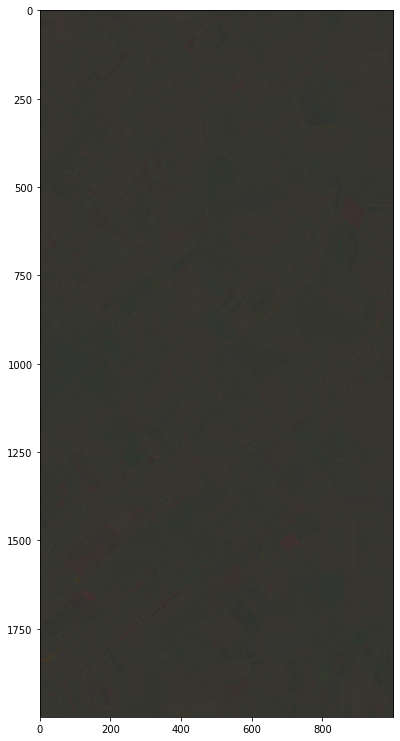

In [73]:
#random_state=1, max_iter=300,hidden_layer_sizes=(60,60,60)
plot_composite(res.astype('float'))

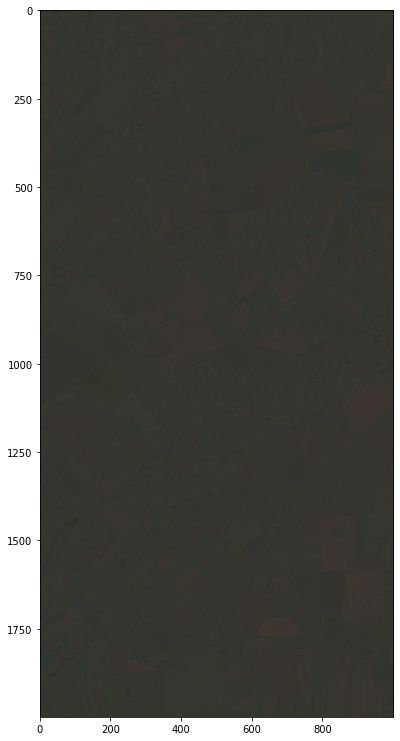

In [21]:
# random_state=1, max_iter=300,hidden_layer_sizes=(30,30,30)
plot_composite(res.astype('float'))

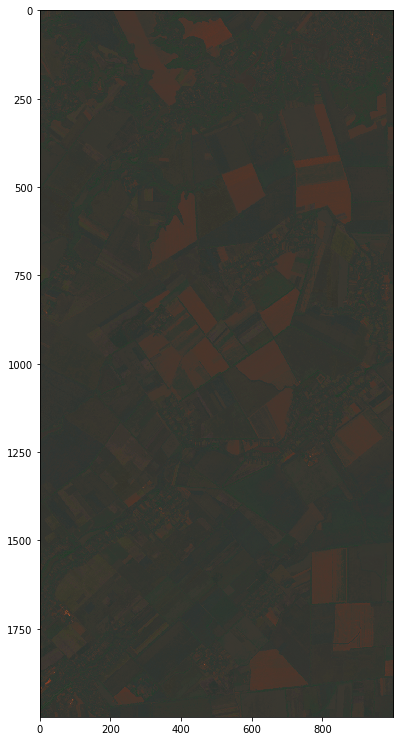

In [21]:
#(random_state=1, max_iter=300,hidden_layer_sizes=(30,30))
plot_composite(res.astype('float'))

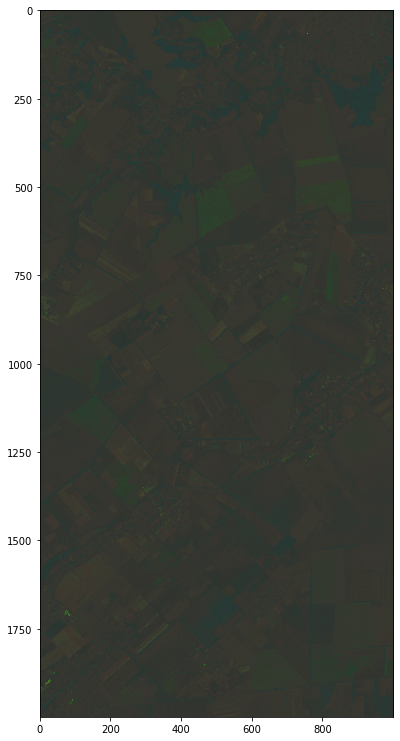

In [11]:
#random_state=1, max_iter=500,hidden_layer_sizes=(150,)
plot_composite(res.astype('float'))

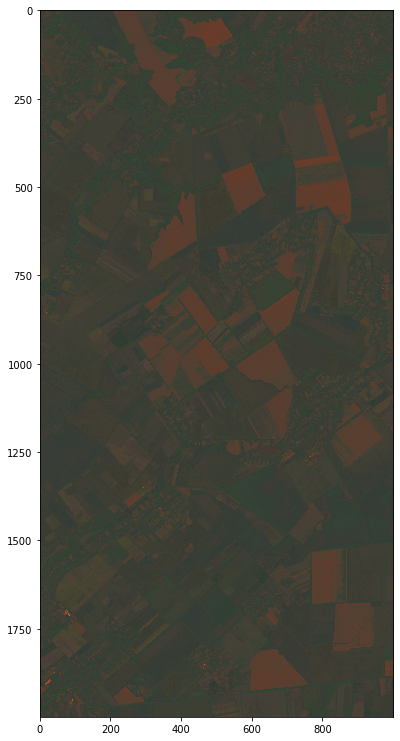

In [22]:
plot_composite(res.astype('int')*1.5)

## Results with mean

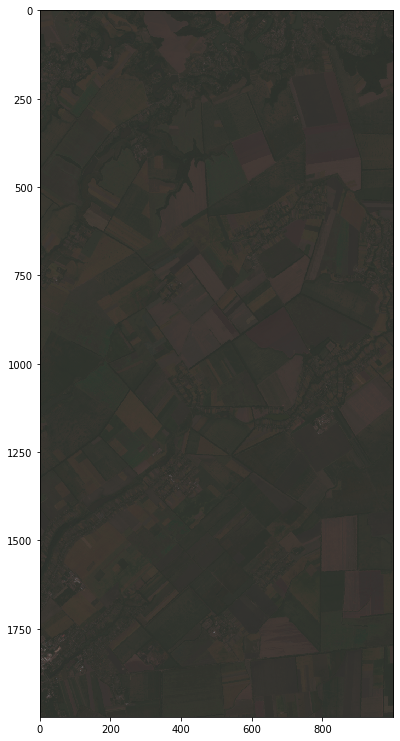

In [16]:
men = np.mean([Y_TRUE,res[:4,:,:]],axis=0)
plot_composite(men)

In [17]:
f = np.copy(clear_comp)
f[:,:,1000:] =men#res[:4,:,:]# men !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [18]:
res.shape

(6, 2000, 1000)

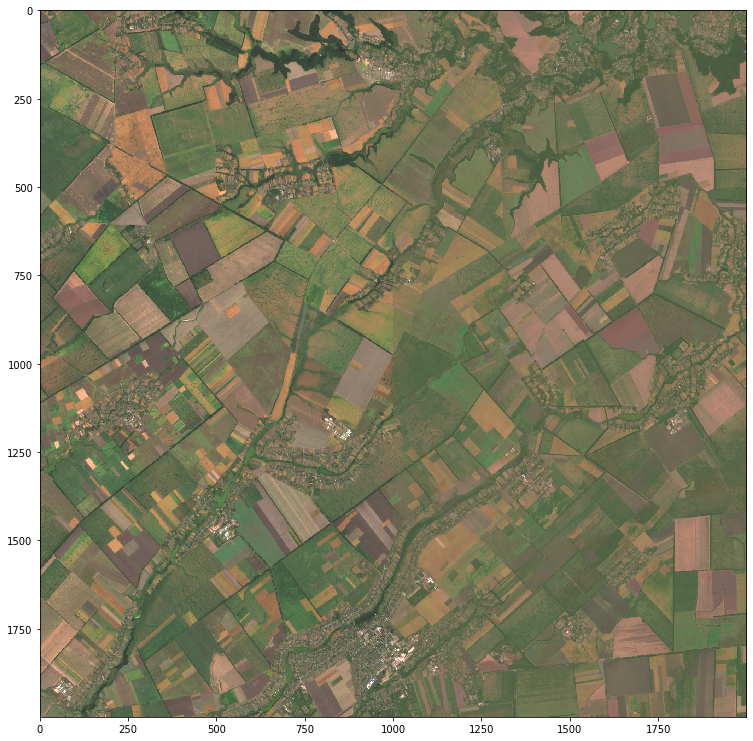

In [19]:
plot_composite(5*f)

# Stats

In [20]:
#random_state=1, max_iter=300,hidden_layer_sizes=(60,60,60)
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

NameError: name 'stats' is not defined

In [79]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.003765049736745407
max_error:  7910.831729893607
mean_absolute_error:  559.29593282261
mean_squared_error:  1034895.1337982845
median_absolute_error:  180.23925547619808
r2_score:  -0.1529138446961653


In [84]:
#(random_state=1,max_iter=300,hidden_layer_sizes=(100,100), activation = 'logistic'
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.699886056768714
max_error:  4166.088452490659
mean_absolute_error:  345.48740907525985
mean_squared_error:  349638.75526150444
median_absolute_error:  102.65402860436271
r2_score:  0.6104886877727911


In [85]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.5656380976756341
max_error:  6665.024306088619
mean_absolute_error:  743.9481700971484
mean_squared_error:  1785618.1439979847
median_absolute_error:  168.2850726675004
r2_score:  -0.9892487773135183


In [93]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,),activation = 'tanh'
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.7066043368633137
max_error:  4114.622421864961
mean_absolute_error:  335.5620774953469
mean_squared_error:  343758.376023732
median_absolute_error:  93.29138537914065
r2_score:  0.6170396613099932


In [94]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.550070993212274
max_error:  6669.0
mean_absolute_error:  718.6856931578253
mean_squared_error:  1772298.3786335303
median_absolute_error:  128.84708938526217
r2_score:  -0.974410035304536


In [19]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,), activation = 'logistic'
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.702507575890015
max_error:  4137.143151459531
mean_absolute_error:  337.6826397846429
mean_squared_error:  346602.8675473274
median_absolute_error:  90.94429853344326
r2_score:  0.613870785979951


In [20]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.5478826810588282
max_error:  6669.0
mean_absolute_error:  714.286434802971
mean_squared_error:  1766707.4396737963
median_absolute_error:  128.89398899693862
r2_score:  -0.9681815096104682


In [14]:
#random_state=1,max_iter=500,hidden_layer_sizes=(300,),activation = 'relu'
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.6821967768028103
max_error:  4664.284289948222
mean_absolute_error:  365.58607317891716
mean_squared_error:  358269.3746477668
median_absolute_error:  137.27015686257948
r2_score:  0.6008738386409713


In [15]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.6491761700419856
max_error:  9999.568579896444
mean_absolute_error:  804.0477049306846
mean_squared_error:  1828989.5609682642
median_absolute_error:  265.0079096637329
r2_score:  -1.0375662400747956


In [17]:
#random_state=1,max_iter=500,hidden_layer_sizes=(100,100,100),activation = 'tanh' #36 хв на канал
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.7016870760204853
max_error:  4172.646314386623
mean_absolute_error:  344.96852134928093
mean_squared_error:  348106.1445306637
median_absolute_error:  106.34138020349087
r2_score:  0.612196076350058


In [18]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.5624283583071645
max_error:  6669.0
mean_absolute_error:  746.3510497834893
mean_squared_error:  1783102.869045981
median_absolute_error:  184.16932974172016
r2_score:  -0.9864466621806165


In [25]:
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.6177572638602076
max_error:  3334.5
mean_absolute_error:  358.77341330453305
mean_squared_error:  442398.39191464207
median_absolute_error:  64.8323055106058
r2_score:  0.5071508076014142


In [23]:
stats(Y_TRUE.reshape(-1,1),res[:4,:,:].reshape(-1,1))

explained_variance_score:  -0.5289709445591699
max_error:  6669.0
mean_absolute_error:  717.5468266090661
mean_squared_error:  1769593.5676585683
median_absolute_error:  129.66461102121164
r2_score:  -0.9713967695943433


In [ ]:
save_narray_no_xarray(f,'mlp.tiff')

In [26]:
def plot_band(composite,ind_band ,min_possible=0, max_possible=10000,min_inten=0.15, max_inten=1.0):
    """
    composite: - composite with bands RGBN, shape(4,x,y)

    """
    composite = composite[ind_band,:,:]
    min_rgb = min_possible
    max_rgb = max_possible
    composite = np.interp(composite, (min_rgb, max_rgb), [min_inten,max_inten])
    composite = composite.astype(float)
    figure(figsize=(13,13))
    return plt.imshow(composite)

In [32]:
def save_narray_no_xarray(array, path, pixel_size = 10):
    x_pixels = array.shape[2]  # number of pixels in x
    y_pixels = array.shape[1]  # number of pixels in y
    bands = array.shape[0]     # number of bands
        
    new_dataset = rasterio.open(path, 'w',
                                driver ='GTiff',
                                height = y_pixels,
                                width  = x_pixels,
                                count  = bands,
                                dtype  = array.dtype)
    for i in range(bands):
        new_dataset.write(array[i,:,:], i+1)
    new_dataset.close()

In [70]:
stats(Y_TRUE.reshape(-1,1), men.reshape(-1,1))#Y_TRUE.reshape(-1,1), men.reshape(-1,1))

explained_variance_score:  0.7032126643425032
max_error:  4750.308182918077
mean_absolute_error:  345.1733018229928
mean_squared_error:  348529.90912492503
median_absolute_error:  106.16204611621339
r2_score:  0.6117239859404502


In [39]:
res[:4,:,:].reshape(-1,1)

array([[798.32039608],
       [799.34356015],
       [791.27133343],
       ...,
       [  0.        ],
       [  0.        ],
       [  0.        ]])

In [37]:
Y_TRUE.shape

(4, 2000, 1000)

In [21]:
def stats(y_true,y_pred):
    print("explained_variance_score: ",explained_variance_score(y_true,y_pred))
    print("max_error: ",max_error(y_true, y_pred))
    print("mean_absolute_error: ",mean_absolute_error(y_true, y_pred))
    print("mean_squared_error: ",mean_squared_error(y_true, y_pred))
    print("median_absolute_error: ",median_absolute_error(y_true, y_pred))
    print("r2_score: ",r2_score(y_true, y_pred))